# Project 2: Generate New Pokemon with GAN

Course: AASD4015 - Advanced Applied Mathematical Concepts for Deep Learning

*   Chotiros Srisiam, #101411914
*   Pat Boonprasertsri, #101410612

## Setup

### Import libraries

In [1]:
import os
import numpy as np
import torch
from torchvision import datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torch import nn, optim
from matplotlib import pyplot as plt
import seaborn as sns

### Check Device Availability
This code checks if a CUDA-enabled GPU is available for computation. If it is, it sets the device to CUDA; otherwise, it sets the device to CPU. 

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cpu


## Dataset
We select Pokemon images dataset from Kaggle (https://www.kaggle.com/datasets/kvpratama/pokemon-images-dataset).

### Define and check dataset path availability

In [3]:
# Define dataset path
path = '../input/pokemon-images-dataset/pokemon'

# Check dataset path availability
if not os.path.exists(path):
    print("Dataset directory does not exist. Please recheck.")
else:
    print("Dataset directory exist. Please continue")

Dataset directory exist. Please continue


### Data exploration

Total number of images: 819
Image dimensions: {(256, 256)}
Color modes: {'RGB'}
Image examples:


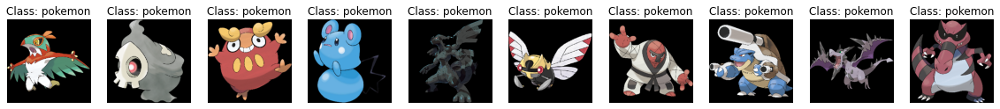

In [4]:
# Load dataset
original_dataset = datasets.ImageFolder(root=path)

# Check total images
print("Total number of images:", len(original_dataset))

# Check image dimensions and color channels
image_dimensions = set()
color_modes = set()

for i in range(len(original_dataset)):
    image, _ = original_dataset[i]
    width, height = image.size
    image_dimensions.add((width, height))
    color_modes.add(image.mode)

print("Image dimensions:", image_dimensions)
print("Color modes:", color_modes)

# Display some original images
import random
num_images_to_display = 10
plt.figure(figsize=(20, 6))
random_images = random.sample(range(len(original_dataset)), num_images_to_display)
for i, idx in enumerate(random_images):
    image, label = original_dataset[idx]
    plt.subplot(1, num_images_to_display, i+1)
    plt.imshow(image)
    plt.title(f"Class: {original_dataset.classes[label]}")
    plt.axis("off")
print("Image examples:")
plt.show()

## Preprocessing

### Define Parameters

In [5]:
norm=((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
batch_size = 64
image_size = 64

### Image Transformations
* Resize to square images (64x64)
* Crop center of the images and ensure that all images are equal to image_size (64x64); In case that image has smaller size, it pads the image.
* Convert the input images into PyTorch tensor and normalizes the pixel values of the image to the range [0.0,1.0]
* Normalization

Then apply all transformations to input images by using compose function.

In [6]:
transf = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(*norm,inplace=True),
])

### Load Preprocessed Dataset

In [7]:
dataset = datasets.ImageFolder(root=path,transform=transf)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

### Unnormalize function

In [8]:
def unnorm(images, means, stds):
    means = torch.tensor(means).reshape(1,3,1,1)
    stds = torch.tensor(stds).reshape(1,3,1,1)
    return images*stds+means

### Show batch of preprocessed images

In [9]:
def show_batch(data_loader):
    for images, labels in data_loader:
        fig, ax = plt.subplots(figsize=(15, 15))
        ax.set_xticks([]); ax.set_yticks([])
        unnorm_images = unnorm(images, *norm)
        ax.imshow(make_grid(unnorm_images[:batch_size], nrow=8).permute(1, 2, 0).clamp(0,1))
        break

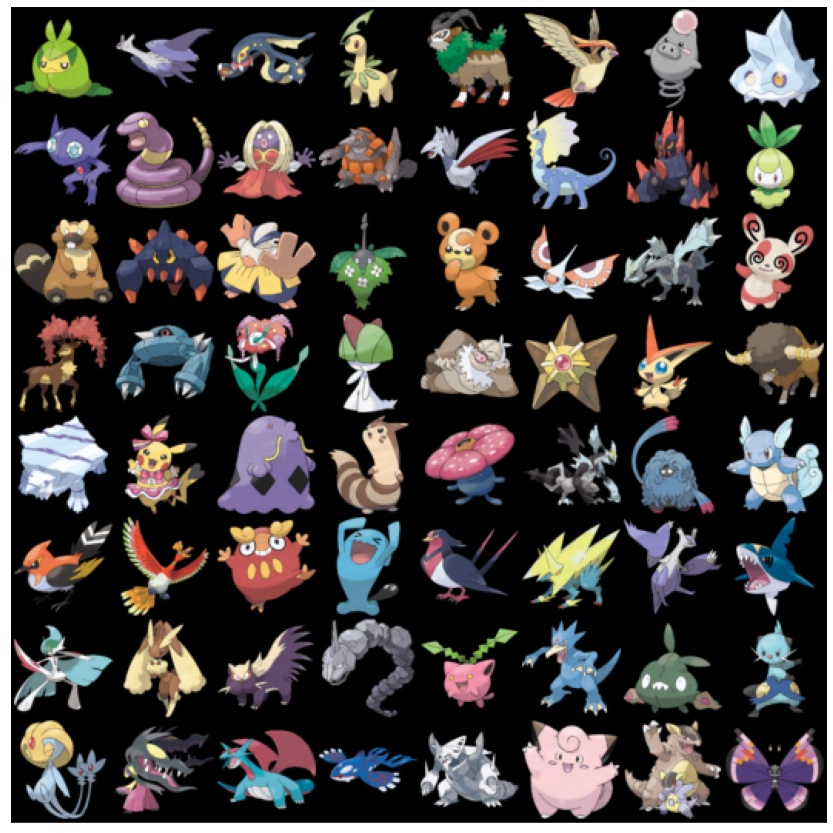

In [10]:
show_batch(dataloader)

## Training

### Define Weight Initialization
To ensure that the weights of convolutional and batch normalization layers are appropriately initialized to facilitate effective training.

In [11]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Define Generator
This code defines a Generator neural network model with a specific architecture suitable for generating images from random noise vectors.

In [12]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(100, 64 * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(64 * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(64 * 8, 64 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(64 * 4, 64 * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64 * 2, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

modelG = Generator()
modelG.to(device)
modelG.apply(weights_init)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

### Define Discriminator
This code defines a discriminator model with a specific architecture tailored for discriminating between real and fake images in a GAN framework.

In [13]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 64 * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64 * 2, 64 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64 * 4, 64 * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64 * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)
    
modelD = Discriminator()
modelD.to(device)
modelD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

### Define necessary components for training model
* Loss function
* Noise input
* label for real (1) and fake (0) data
* Optimizers

In [14]:
# Loss function
criterion = nn.BCELoss()

# Noise input
fixed_noise = torch.randn(64, 100, 1, 1, device=device)

# label for sample data
real_label = 1.
fake_label = 0.

# Optimizers
optimizerD = optim.Adam(modelD.parameters(), lr=0.0001, betas=(0.5, 0.999))
optimizerG = optim.Adam(modelG.parameters(), lr=0.0001, betas=(0.5, 0.999))

### Training Loop

In [15]:
import torchvision.utils as vutils

img_list = []
G_losses, D_losses = [], []
total = 0

for epoch in range(250):
    g_loss = 0.0
    d_loss = 0.0
    D_x = 0.0
    D_G_z1 = 0.0
    D_G_z2 = 0.0
    
    for i, data in enumerate(dataloader, 0):
        
        modelD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        output = modelD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x += output.mean().item()
        noise = torch.randn(b_size, 100, 1, 1, device=device)
        fake = modelG(noise)
        label.fill_(fake_label)
        output = modelD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 += output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        modelG.zero_grad()
        label.fill_(real_label)
        output = modelD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 += output.mean().item()
        optimizerG.step()
        
        g_loss += errG.item()
        d_loss += errD.item()
        total += b_size
        
    avg_g_loss = g_loss / total
    G_losses.append(avg_g_loss)
    avg_d_loss = d_loss / total
    D_losses.append(avg_d_loss)
    
    avg_D_x = D_x / len(dataloader)
    avg_D_G_z1 = D_G_z1 / len(dataloader)
    avg_D_G_z2 = D_G_z2 / len(dataloader)
    
    print('Epoch: {} \tDiscriminator Loss: {:.6f} \tGenerator Loss: {:.6f} \tD(x): {:.6f} \tD(G(z)): {:.6f} / {:.6f}'.format(
        epoch + 1,
        avg_d_loss,
        avg_g_loss,
        avg_D_x,
        avg_D_G_z1,
        avg_D_G_z2
    ))
 

    with torch.no_grad():
        fake = modelG(fixed_noise).detach().cpu()
    img_list.append(vutils.make_grid(unnorm(fake, *norm), padding=2, normalize=True))
    
print('Finished Training')

Epoch: 1 	Discriminator Loss: 0.009763 	Generator Loss: 0.064070 	D(x): 0.862160 	D(G(z)): 0.273667 / 0.039166
Epoch: 2 	Discriminator Loss: 0.001910 	Generator Loss: 0.045864 	D(x): 0.926403 	D(G(z)): 0.119814 / 0.005296
Epoch: 3 	Discriminator Loss: 0.000839 	Generator Loss: 0.035453 	D(x): 0.938506 	D(G(z)): 0.075306 / 0.001968
Epoch: 4 	Discriminator Loss: 0.000454 	Generator Loss: 0.030955 	D(x): 0.956018 	D(G(z)): 0.060654 / 0.000650
Epoch: 5 	Discriminator Loss: 0.000288 	Generator Loss: 0.026651 	D(x): 0.962419 	D(G(z)): 0.045912 / 0.000391
Epoch: 6 	Discriminator Loss: 0.000154 	Generator Loss: 0.022749 	D(x): 0.977232 	D(G(z)): 0.031875 / 0.000293
Epoch: 7 	Discriminator Loss: 0.000108 	Generator Loss: 0.019670 	D(x): 0.981550 	D(G(z)): 0.024920 / 0.000250
Epoch: 8 	Discriminator Loss: 0.001236 	Generator Loss: 0.031355 	D(x): 0.900739 	D(G(z)): 0.066532 / 0.002789
Epoch: 9 	Discriminator Loss: 0.000758 	Generator Loss: 0.027143 	D(x): 0.908004 	D(G(z)): 0.105771 / 0.000468
E

### Save generator and discriminator models

In [16]:
torch.save(modelG.state_dict(), 'G.pth')
torch.save(modelD.state_dict(), 'D.pth')

## Result

### Training Losses over training epoches

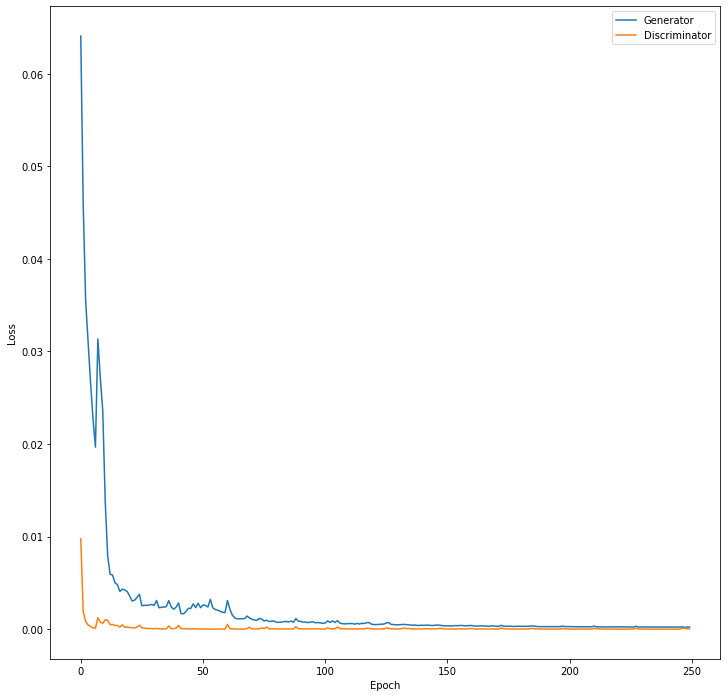

In [17]:
plt.figure(figsize=(12,12))
plt.plot(G_losses,label="Generator")
plt.plot(D_losses,label="Discriminator")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

**Loss Function Analysis:**

* Discriminator’s Performance: At first, the Discriminator quickly gets better at telling apart real and fake images, which is good because it shows it's learning well.
* Generator’s Progress: The Generator also improves, but not as fast. It struggles a bit at first to make believable images, but as training goes on, it gets better at making images that fool the Discriminator.

Overall, the pattern suggests the GAN is working as expected: the Discriminator gets good fast and then levels off, while the Generator takes more time but eventually gets better. This is common in GAN training because making convincing images is harder than spotting them. The aim is for both sides to keep improving until the generated images look just like real ones.

### Animation to visualize the generated images during the training process

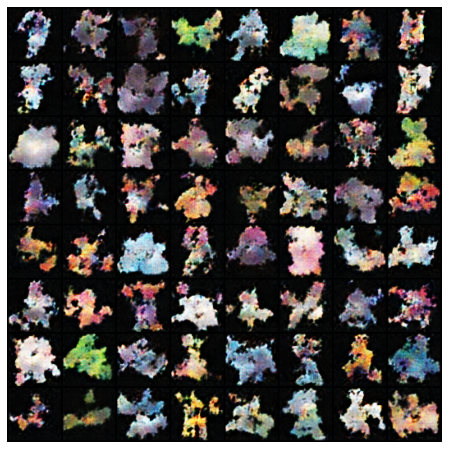

In [18]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8, 8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list[::15]]
ani = animation.ArtistAnimation(fig, ims, interval=250, repeat_delay=250, blit=True)

HTML(ani.to_jshtml())